Deep Learning EX3 - Object Detection - YOLOv5 - Lioz & Rotem

This is our implementation of Yolov5 algorithm for objects detection. 
 
We used our custom data set that contains 100 images of animals (Giraffe, Rat). This data set was divided by 70% 20% 10% principle where 70 images for train, 20 for val and 10 for test. 

 For labeling the images we used `***makesense.ai***` wabsite wich was very intuitive and easy to use. 

We also made minor customization in ***`.yaml`*** file, this was neccesary for providing the path to our data


# Setup

Need to import the Yolov5 first

Clone repo, install dependencies and check PyTorch and GPU. 

In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
from yolov5 import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-105-g226a5e4 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 24.4/78.2 GB disk)


The line bellow is for unzipping the dataset we imported

In [4]:
!unzip -q ../train_data.zip -d ../

In [6]:
# Train YOLOv5s on custom_data for 60 epochs
!python train.py --img 640 --batch 2 --epochs 200 --data custom_data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=custom_data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=2, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-105-g226a5e4 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0

In [7]:
# Run YOLOv5x on Custom val
!python val.py --weights /content/yolov5/runs/train/exp/weights/best.pt  --data custom_data.yaml --img 640 --iou 0.65 --half

val: data=/content/yolov5/data/custom_data.yaml, weights=['/content/yolov5/runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-105-g226a5e4 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/train_data/labels/val.cache... 14 images, 0 backgrounds, 0 corrupt: 100% 14/14 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 1/1 [00:00<00:00,  1.15it/s]
                   all         14         21      0.927      0.842        0.9      0.597
               giraffe         14         11      0.896      0.785      0.815      0.498
      

In [11]:
# Run YOLOv5x on Custom test
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 640 --source ../test_data

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=../test_data, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-105-g226a5e4 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/11 /content/test_data/1.jpeg: 448x640 2 giraffes, 13.2ms
image 2/11 /content/test_data/10.jpeg: 352x640 (no detections), 14.5ms
image 3/11 /content/test_data/11.jpeg: 384x640 1 rat, 13.4ms
image 4/11 /content/test_data/2.jpeg: 448x640 2 giraffes, 9.9ms
image 5/11 /content/test_data/3.jpeg: 352x640 1 giraffe, 9.3ms
image 6/11 /c

In [12]:
# Tensorboard  (optional)
%load_ext tensorboard
%tensorboard --logdir runs/train

<IPython.core.display.Javascript object>

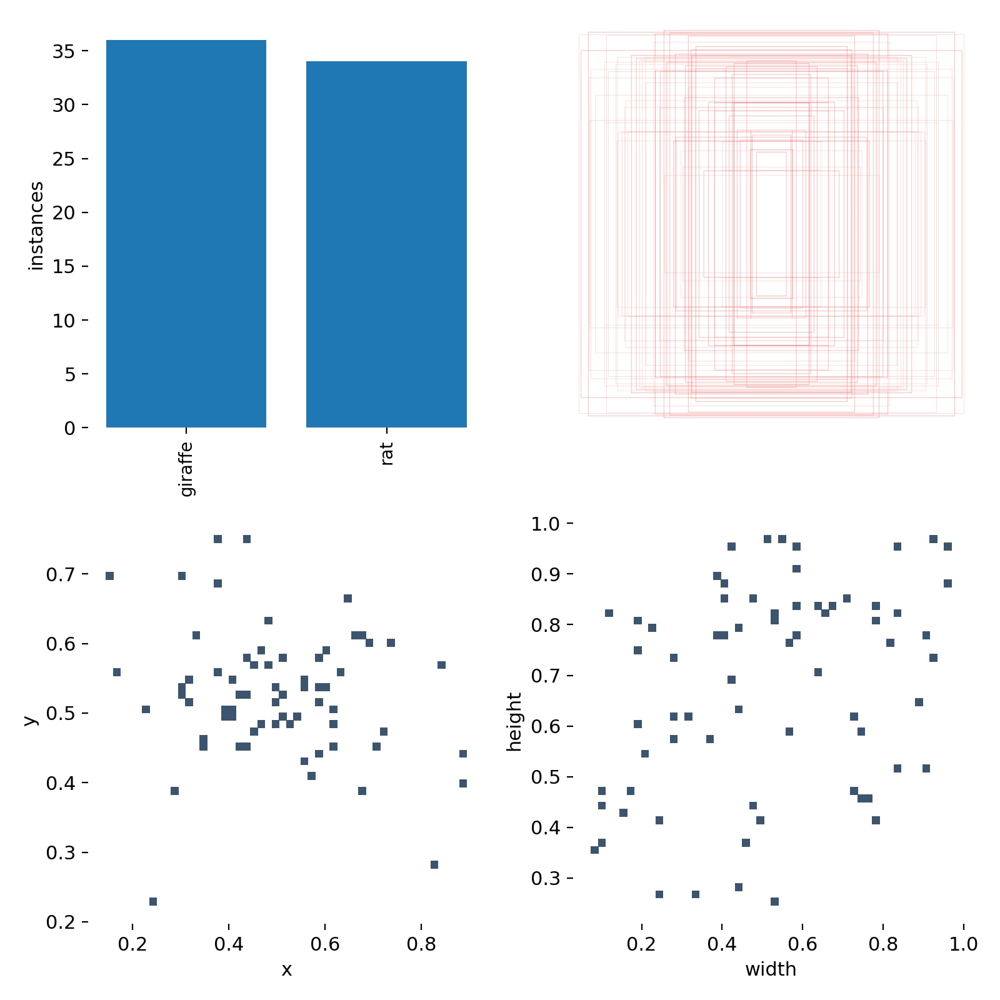

In [14]:
from IPython.display import Image, clear_output  # to display images
from utils.plots import plot_results 
plot_results('/content/yolov5/runs/train/exp/results.csv')  # plot 'results.csv' as 'results.png' 
Image(filename='/content/yolov5/runs/train/exp/labels.jpg', width=1500)

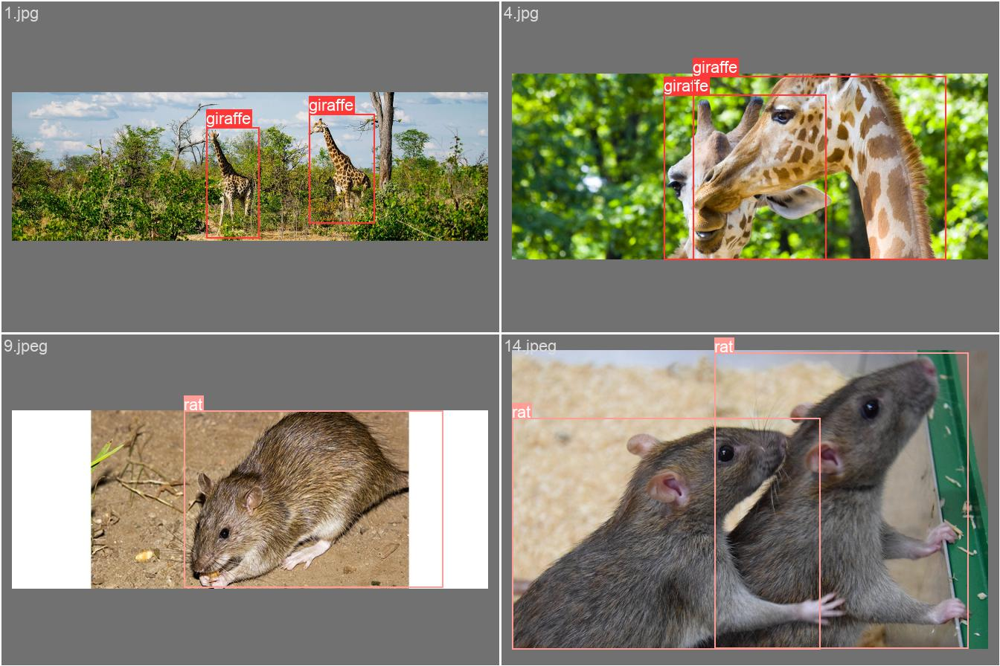

In [15]:
Image(filename='/content/yolov5/runs/train/exp/val_batch0_labels.jpg', width=2500)

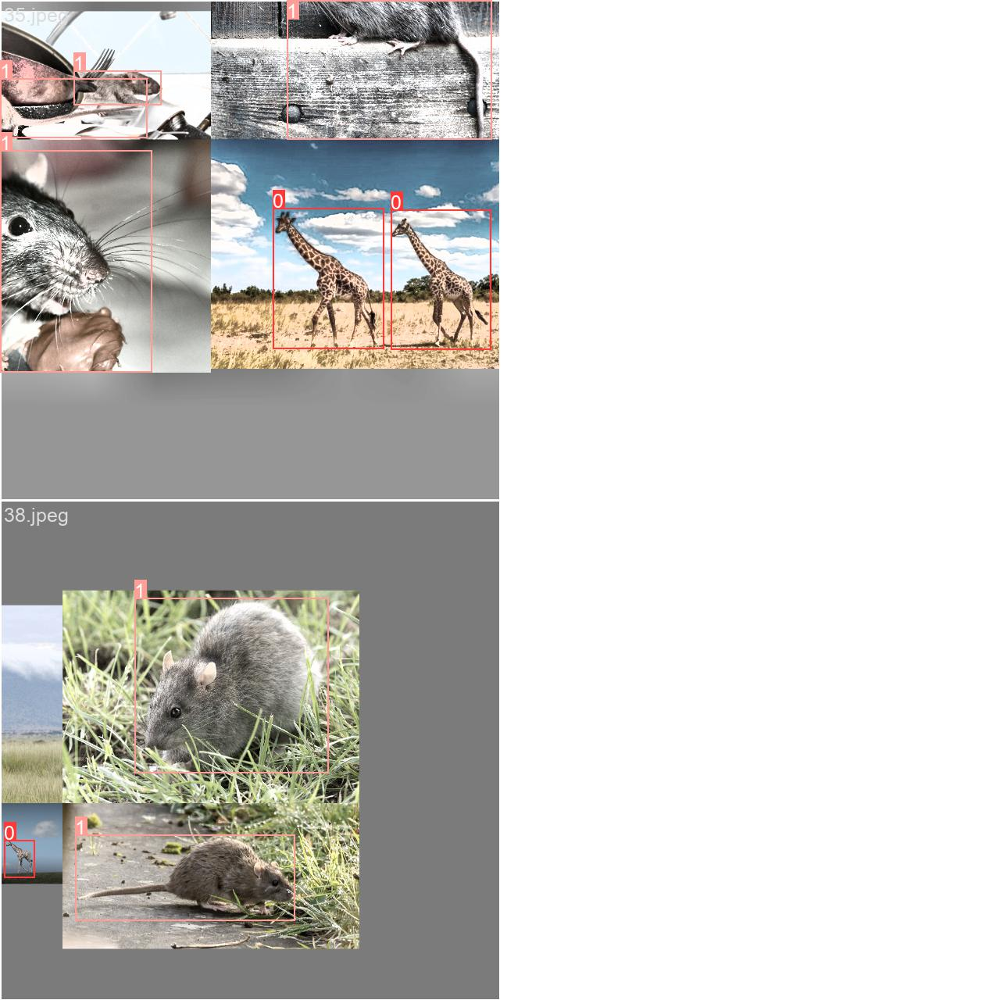

In [16]:
Image(filename='/content/yolov5/runs/train/exp/train_batch1.jpg', width=2500)

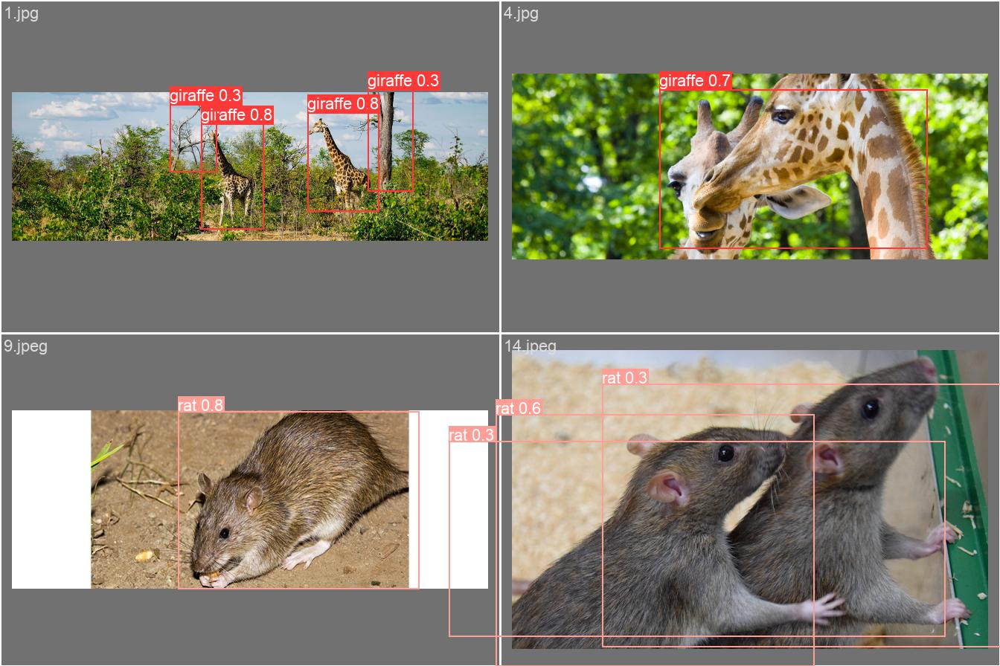

In [17]:
Image(filename='/content/yolov5/runs/train/exp/val_batch0_pred.jpg', width=2500)

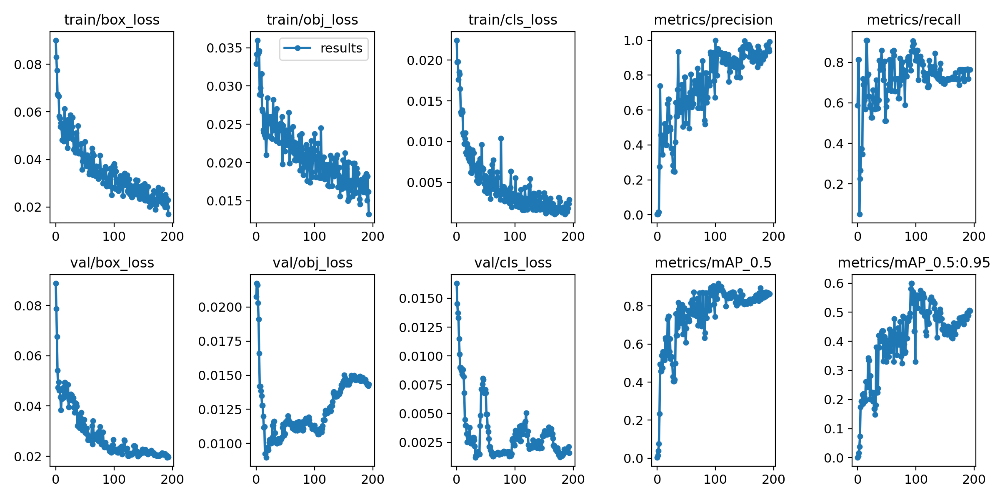

In [18]:
Image(filename='/content/yolov5/runs/train/exp/results.png', width=1500)

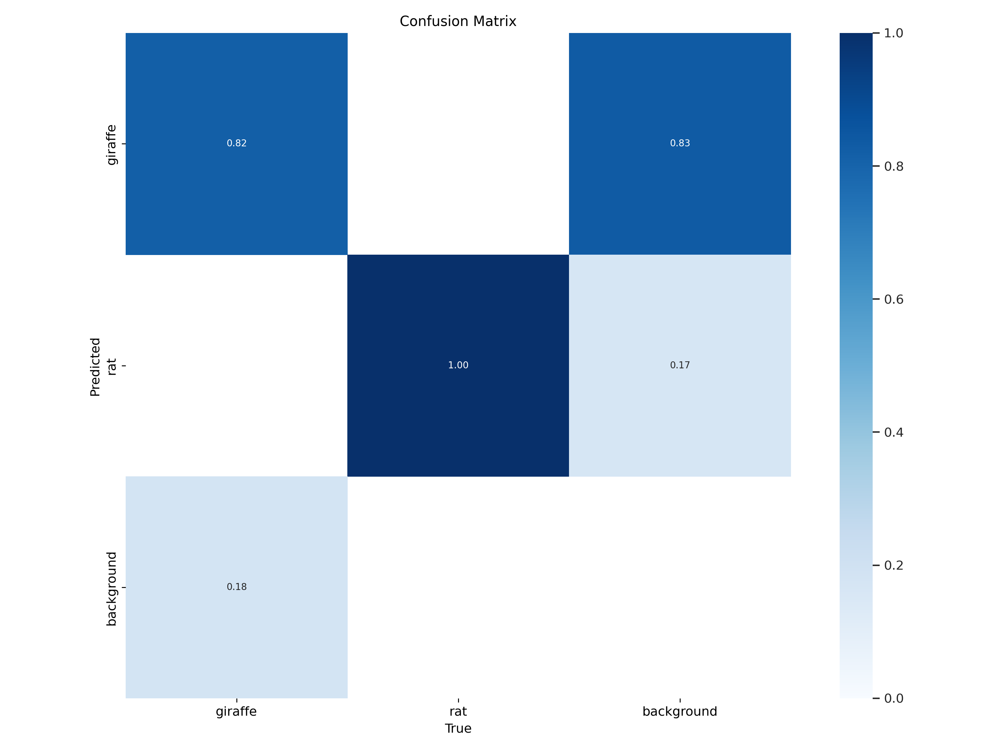

In [19]:
Image(filename='/content/yolov5/runs/train/exp/confusion_matrix.png', width=850)

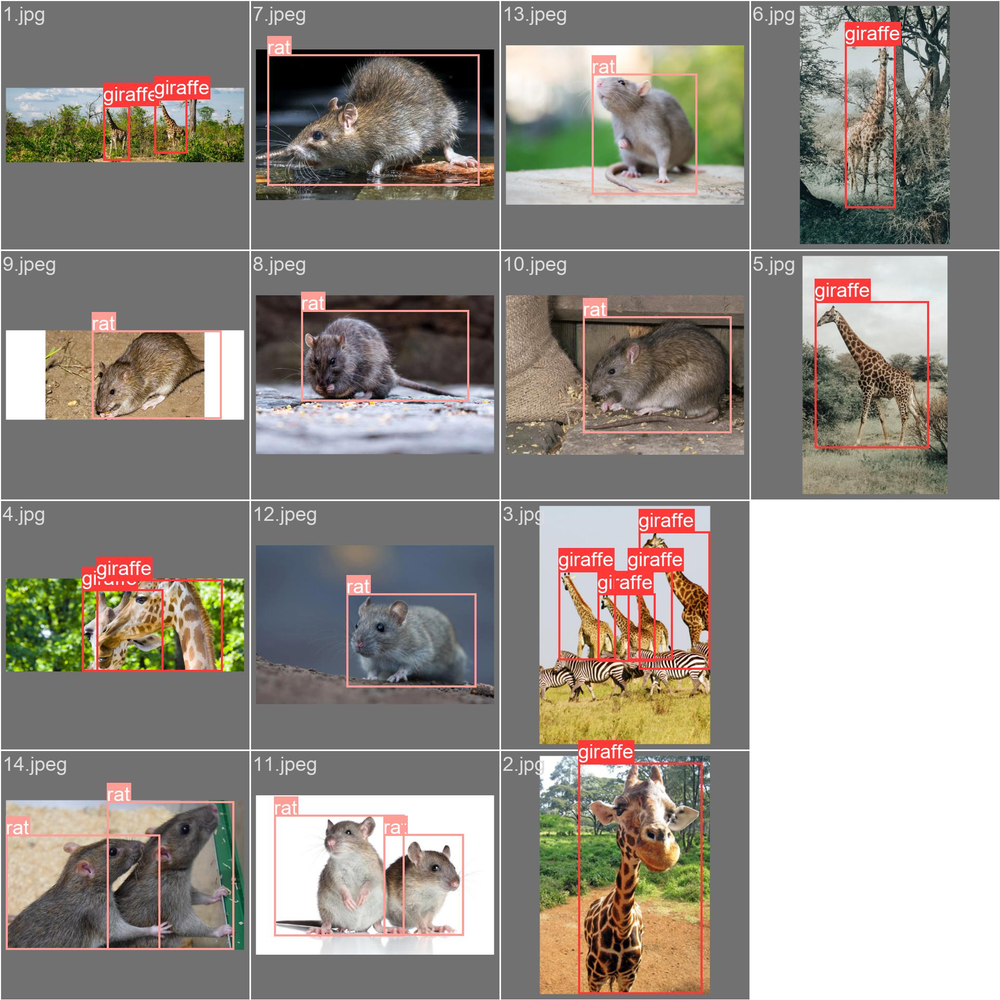

In [20]:
Image(filename='/content/yolov5/runs/val/exp/val_batch0_labels.jpg', width=2500)

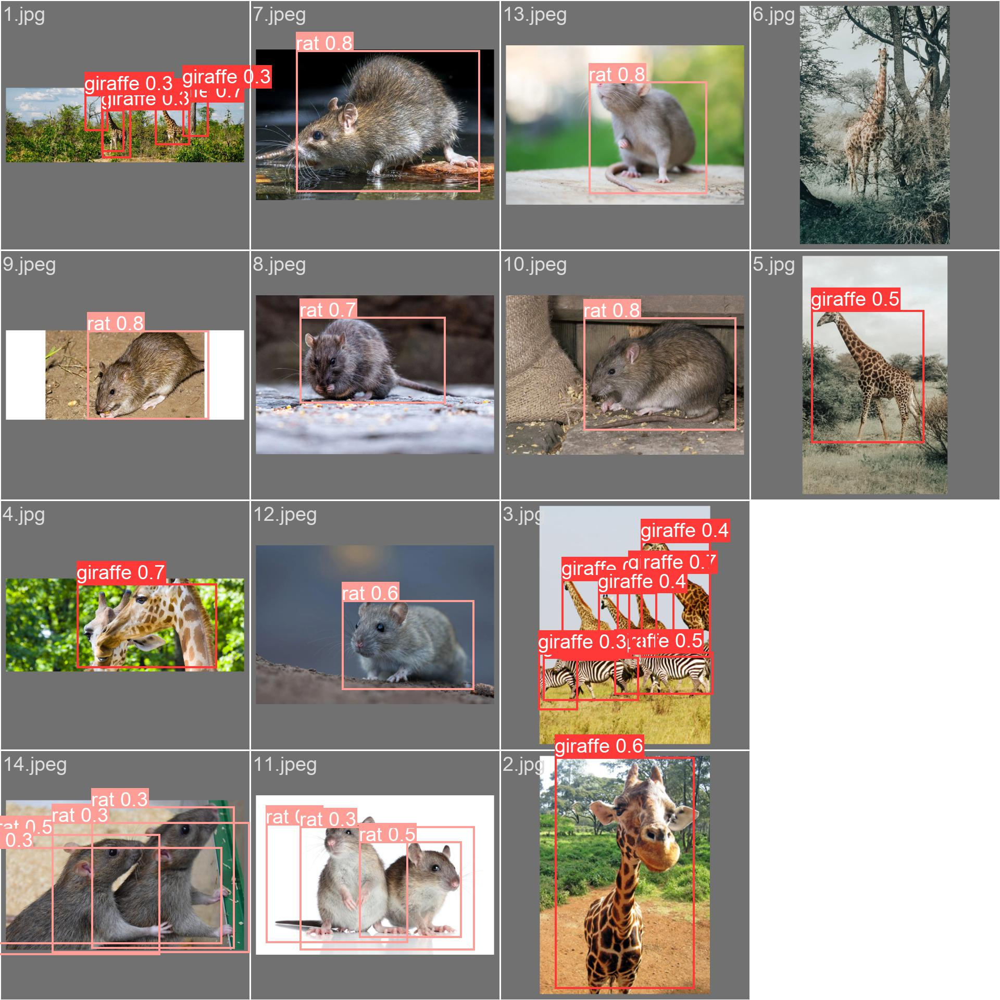

In [21]:
Image(filename='/content/yolov5/runs/val/exp/val_batch0_pred.jpg', width=2500)

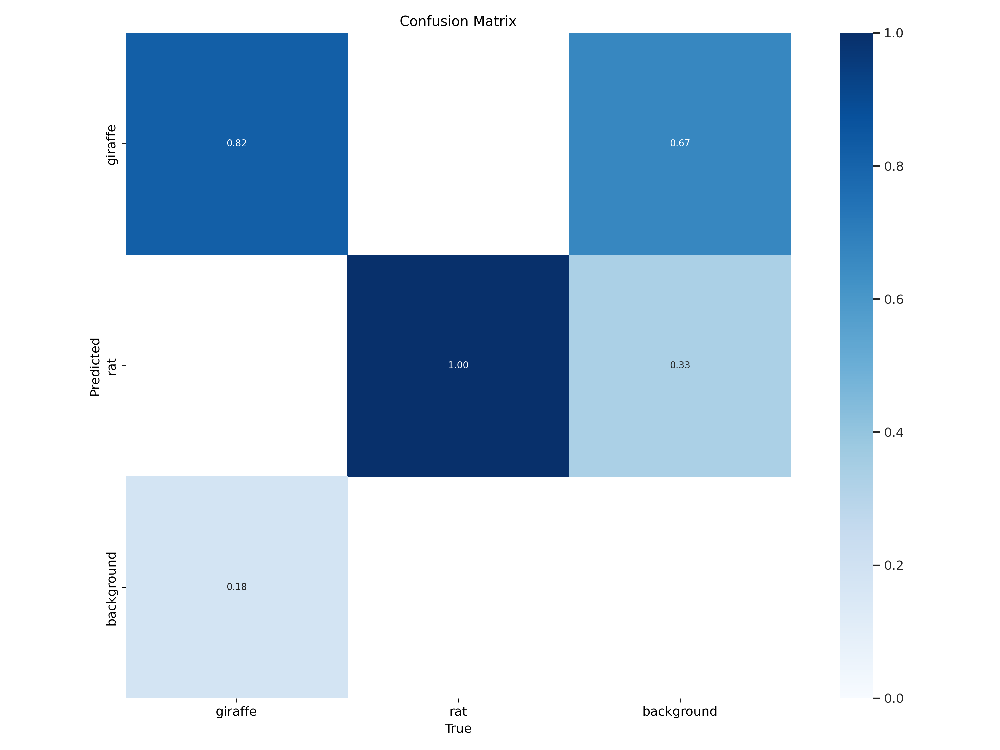

In [22]:
Image(filename='/content/yolov5/runs/val/exp/confusion_matrix.png', width=850)

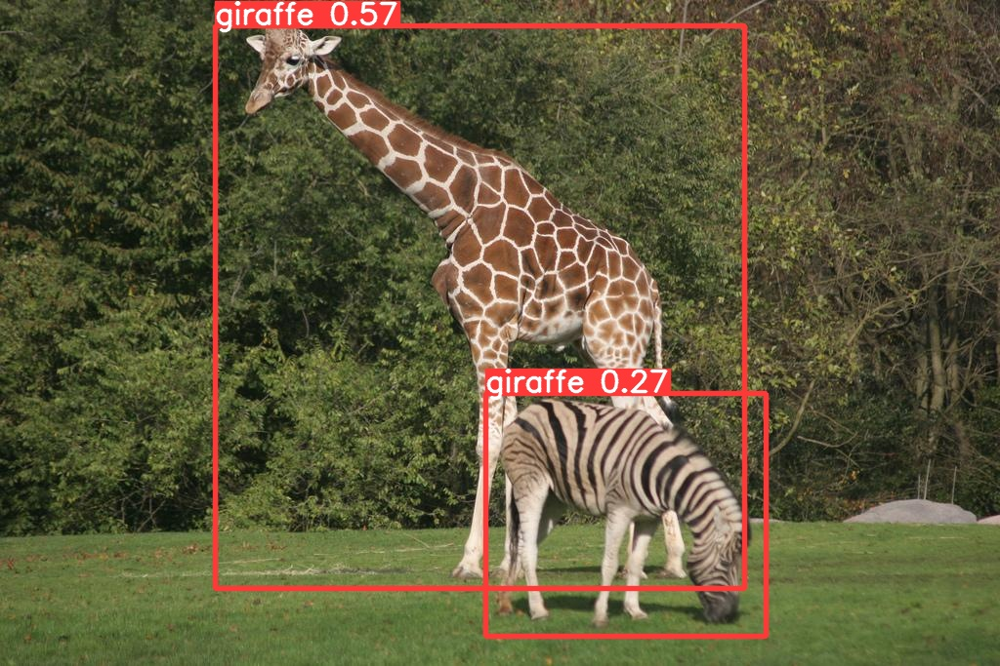

/n


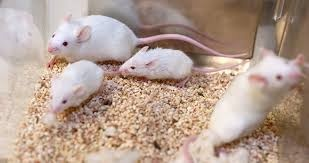

/n


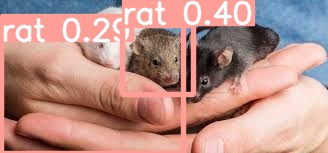

/n


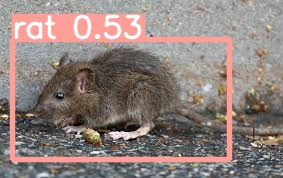

/n


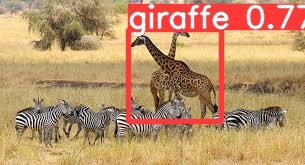

/n


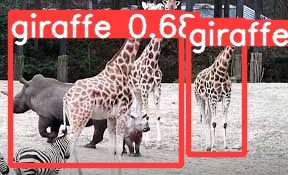

/n


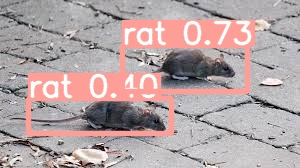

/n


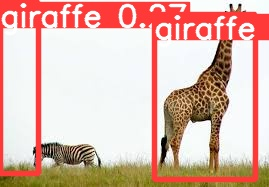

/n


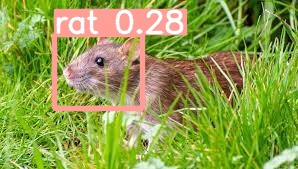

/n


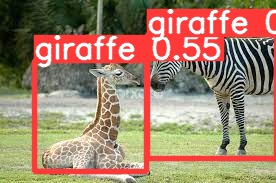

/n


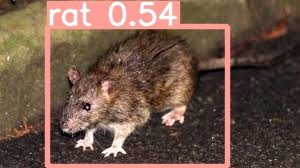

/n


In [25]:
import glob

from IPython.display import Image, display

for imagename in glob.glob('/content/yolov5/runs/detect/exp3/*.jpeg'):
  display(Image(filename=imagename))
  print('/n')